In [1]:
%load_ext nb_black

<IPython.core.display.Javascript object>

In [2]:
# Imports
from os import makedirs
from os.path import join, isfile
import joblib
import numpy as np

rng_seed = 399
np.random.seed(rng_seed)
from scipy.stats import pearsonr
from matplotlib import pyplot as plt
import seaborn as sns

sns.set_theme(style="ticks")

from tqdm.auto import tqdm
import pandas as pd
import gudhi as gd
from gudhi.wasserstein import wasserstein_distance

from nltk.corpus import wordnet as wn
import annoy
from umap import UMAP
from sklearn.decomposition import PCA

import plotly.offline as pyo

pyo.init_notebook_mode()
import plotly.express as px
import plotly.graph_objects as go

# Directory constants
topological_data_analysis_data_dir = "data"
root_code_dir = ".."
output_dir = join(root_code_dir, "output")
word2vec_training_dir = join(output_dir, "word2vec_training")
word2vec_ann_indices_dir = join(output_dir, "word2vec_ann_indices")
word2vec_cluster_analysis_dir = join(output_dir, "word2vec_cluster_analysis")
tps_dir = join(output_dir, "topological_polysemy_experimentation")

# Extend sys path for importing custom Python files
import sys

sys.path.append(root_code_dir)

from utils import (
    get_model_checkpoint_filepaths,
    pairwise_cosine_distances,
    words_to_vectors,
    normalize_array,
)
from word_embeddings.word2vec import load_model_training_output
from vis_utils import plot_word_vectors
from topological_data_analysis.tda_utils import (
    plot_persistence_diagram,
    generate_points_in_spheres,
)
from topological_data_analysis.topological_polysemy import (
    tps,
    tps_point_cloud,
    tps_multiple,
)

<IPython.core.display.Javascript object>

# Prepare data

In [3]:
# Constants
tps_neighbourhood_size = 50

<IPython.core.display.Javascript object>

In [4]:
# Load output from training word2vec
w2v_training_output = load_model_training_output(
    model_training_output_dir=join(
        word2vec_training_dir, "word2vec_enwiki_jan_2021_word2phrase"
    ),
    model_name="word2vec",
    dataset_name="enwiki",
    return_normalized_embeddings=True,
    return_scann_instance=True,
)
last_embedding_weights = w2v_training_output["last_embedding_weights"]
last_embedding_weights_normalized = w2v_training_output[
    "last_embedding_weights_normalized"
]
last_embedding_weights_scann_instance = w2v_training_output[
    "last_embedding_weights_scann_instance"
]
words = w2v_training_output["words"]
word_to_int = w2v_training_output["word_to_int"]
word_counts = w2v_training_output["word_counts"]

<IPython.core.display.Javascript object>

In [5]:
# Load SemEval data
semeval_2010_14_word_senses = joblib.load(
    join(topological_data_analysis_data_dir, "semeval_2010_14_word_senses.joblib")
)

<IPython.core.display.Javascript object>

# Topolocial polysemy

## TPS for 100 SemEval target words

In [6]:
# Prepare data
semeval_target_word_tps_scores = {}

semeval_target_words = np.array(list(semeval_2010_14_word_senses["all"].keys()))
semeval_target_words_in_vocab_filter = [
    i for i, word in enumerate(semeval_target_words) if word in word_to_int
]
semeval_target_words_in_vocab = semeval_target_words[
    semeval_target_words_in_vocab_filter
]
semeval_gs_clusters = np.array(list(semeval_2010_14_word_senses["all"].values()))
semeval_gs_clusters_in_vocab = semeval_gs_clusters[semeval_target_words_in_vocab_filter]

num_semeval_words = len(semeval_gs_clusters_in_vocab)

<IPython.core.display.Javascript object>

 12%|█▏        | 12/98 [00:00<00:00, 118.57it/s]

Neighbourhood size: 50


100%|██████████| 98/98 [00:00<00:00, 121.02it/s]


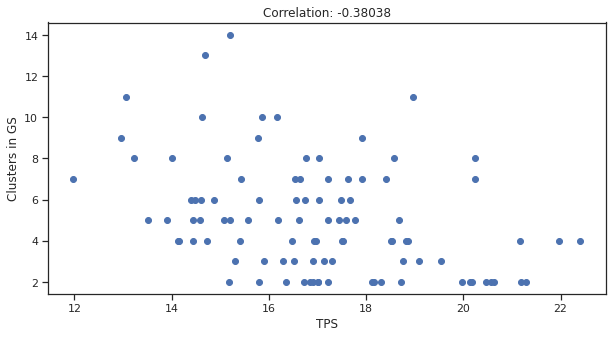

<IPython.core.display.Javascript object>

In [12]:
print(f"Neighbourhood size: {tps_neighbourhood_size}")

# Compute TPS scores
semeval_tps_scores, semeval_tps_persistence_diagrams = tps_multiple(
    target_words=semeval_target_words_in_vocab,
    word_embeddings=last_embedding_weights,
    words_vocabulary=None,
    word_to_int=word_to_int,
    neighbourhood_size=tps_neighbourhood_size,
    word_embeddings_normalized=last_embedding_weights_normalized,
    word_embeddings_pairwise_dists=None,
    ann_instance=last_embedding_weights_scann_instance,
    return_persistence_diagram=True,
    n_jobs=1,
    progressbar_enabled=True,
)

# Compute correlation
semeval_tps_score_gs_correlation, _ = pearsonr(
    x=semeval_tps_scores, y=semeval_gs_clusters_in_vocab
)

# Plot TPS scores to GS
plt.figure(figsize=(10, 5))
plt.scatter(x=semeval_tps_scores, y=semeval_gs_clusters_in_vocab)
plt.xlabel("TPS")
plt.ylabel("Clusters in GS")
plt.title(f"Correlation: {semeval_tps_score_gs_correlation:.5f}")
plt.show()

## Correlation plots of TPS scores of various word embeddings

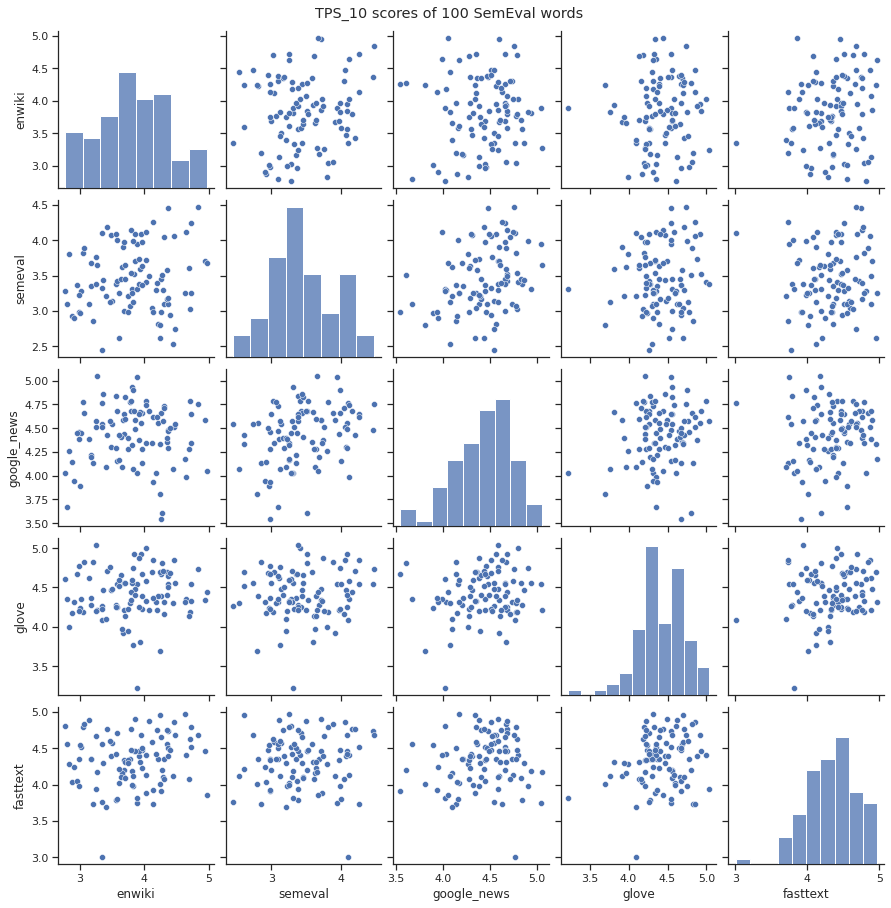

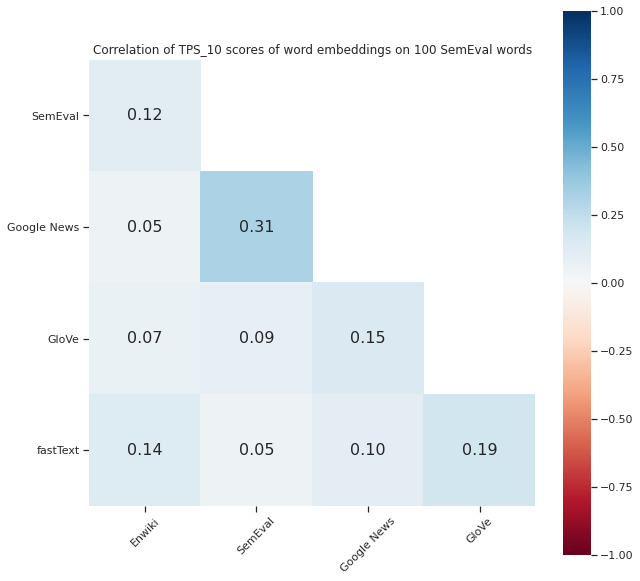

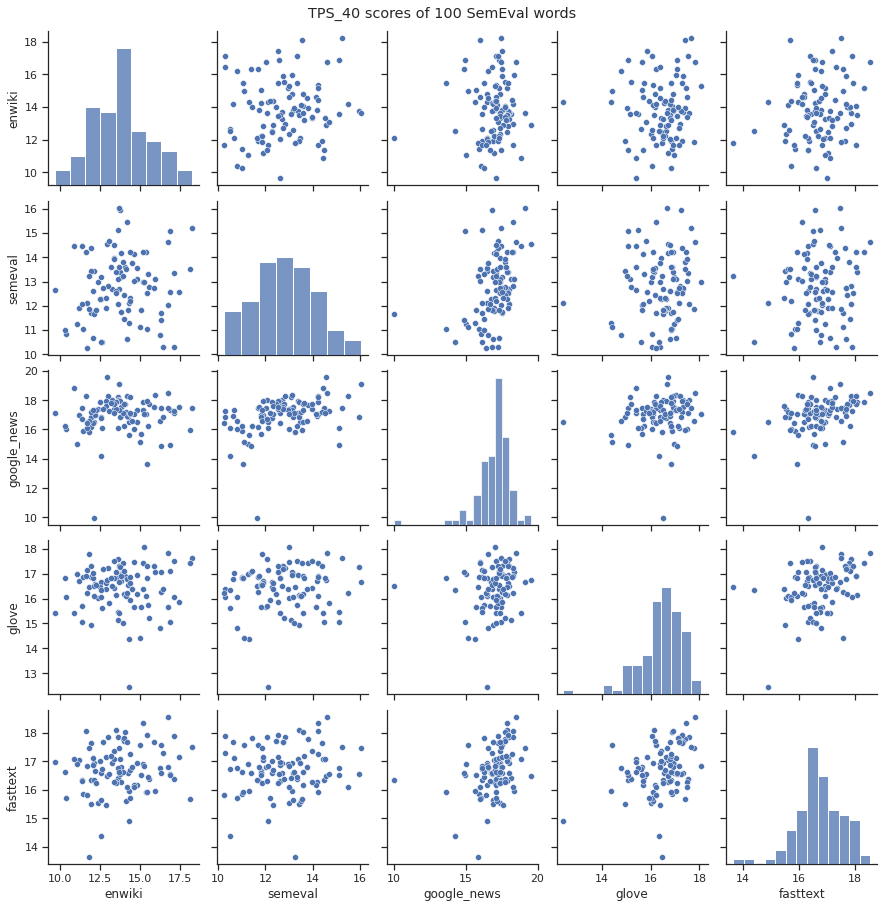

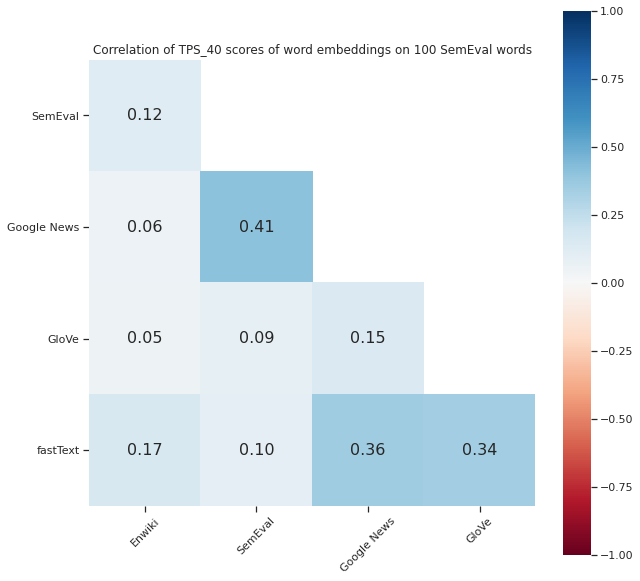

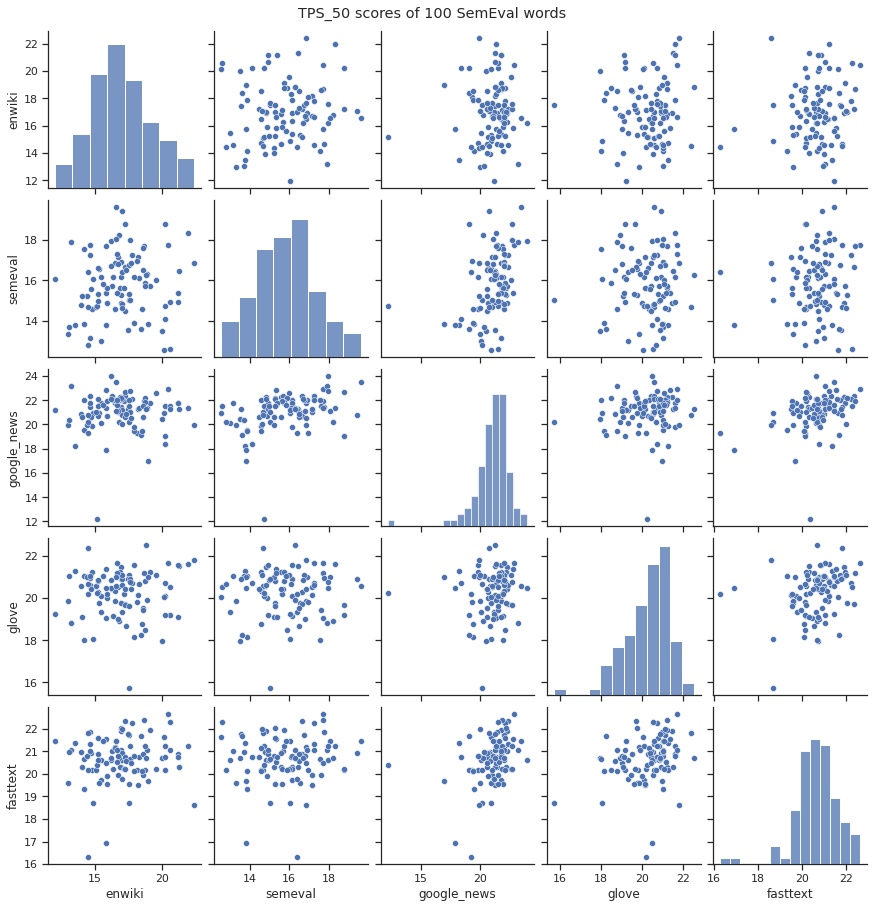

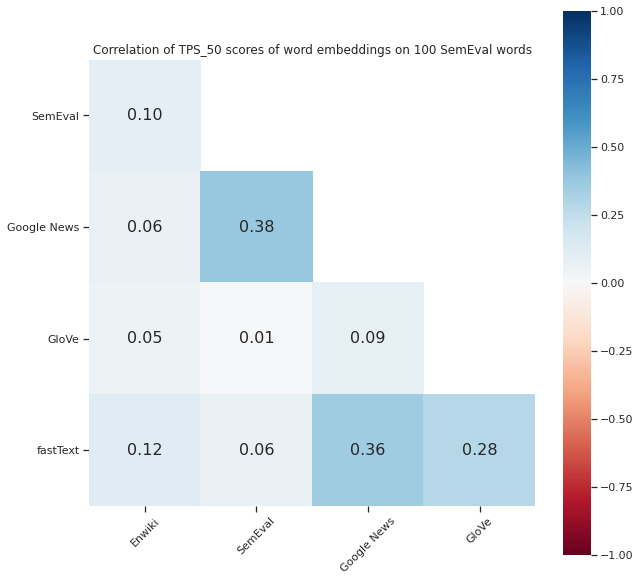

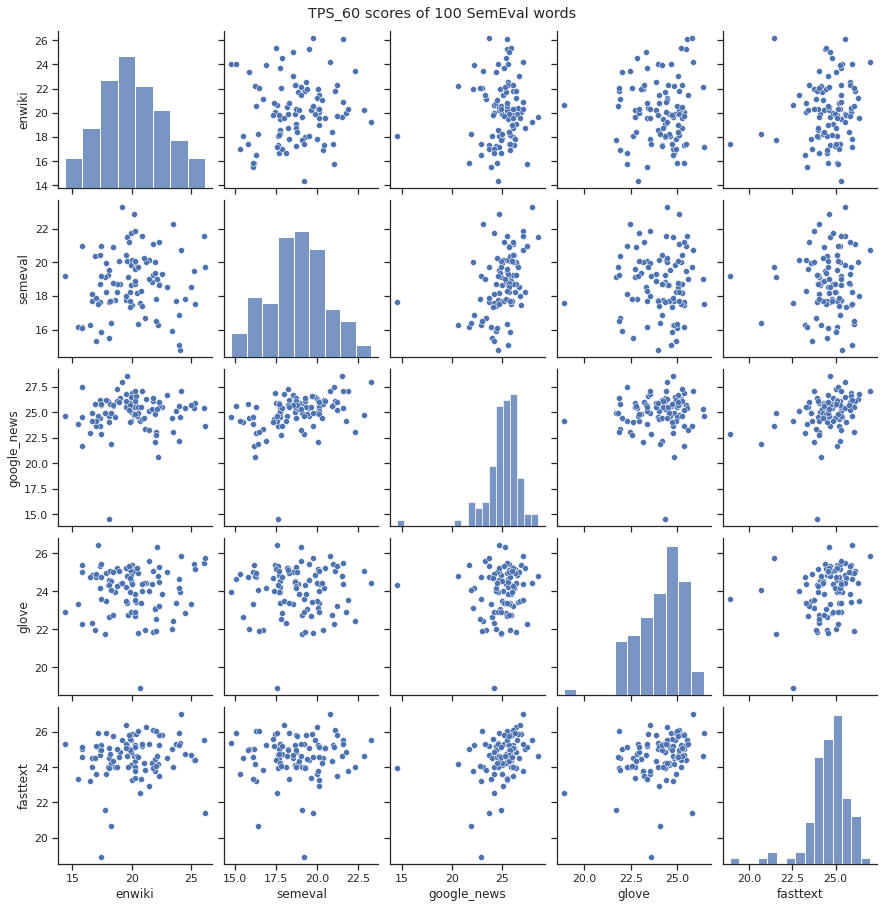

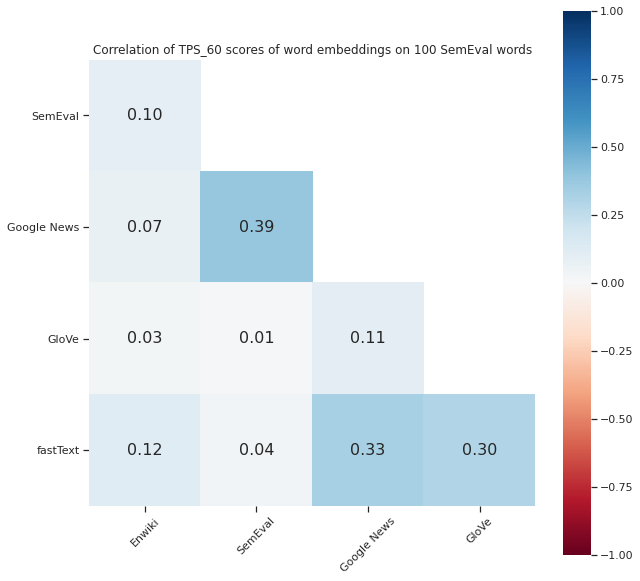

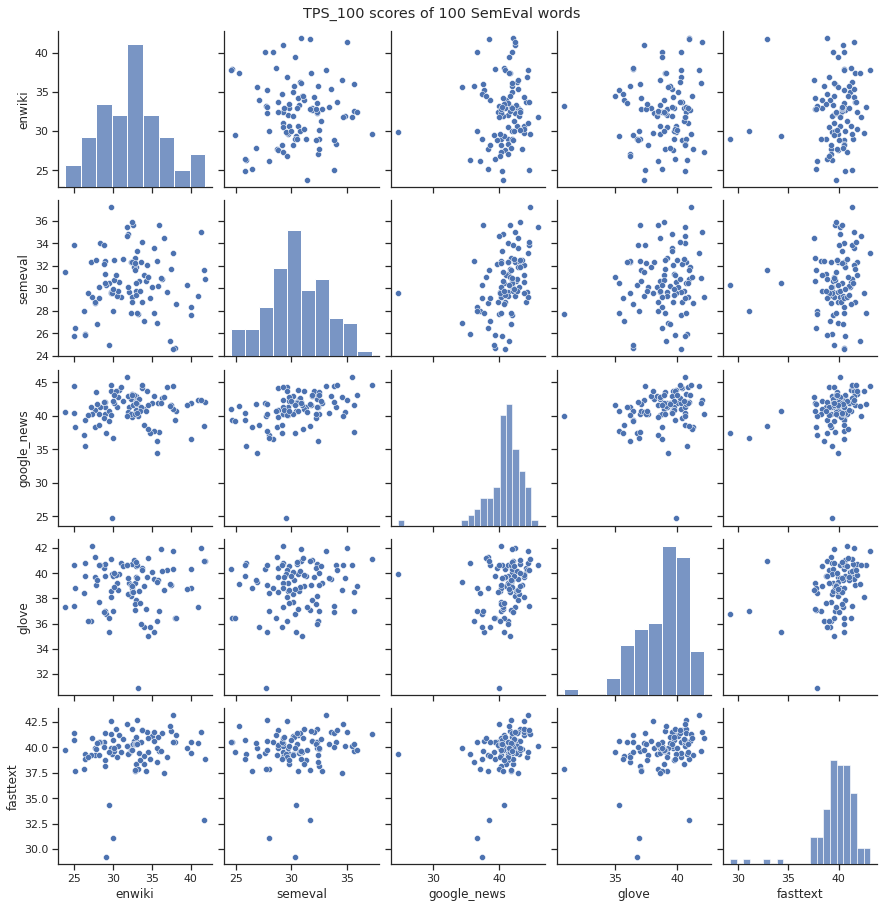

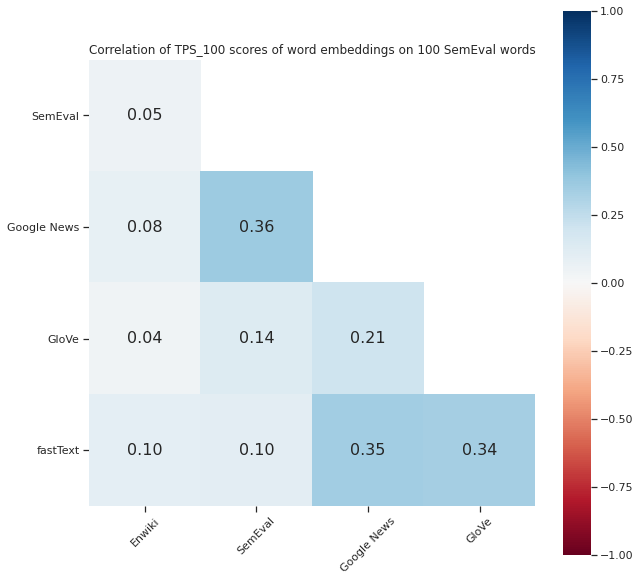

<IPython.core.display.Javascript object>

In [8]:
for neighbourhood_size in [10, 40, 50, 60, 100]:

    # Load TPS scores and create df
    enwiki_tps_scores = np.load(
        join(tps_dir, "enwiki", f"tps_{neighbourhood_size}_vs_gs.npy")
    )
    semeval_tps_scores = np.load(
        join(tps_dir, "semeval_2010_task_14", f"tps_{neighbourhood_size}_vs_gs.npy")
    )
    google_news_tps_scores = np.load(
        join(tps_dir, "google_news_3m", f"tps_{neighbourhood_size}_vs_gs.npy")
    )
    glove_tps_scores = np.load(
        join(tps_dir, "glove_cc_840b_300d", f"tps_{neighbourhood_size}_vs_gs.npy")
    )
    fasttext_tps_scores = np.load(
        join(tps_dir, "fasttext_cc_300d", f"tps_{neighbourhood_size}_vs_gs.npy")
    )

    # Ensure we have the same number of TPS scores
    num_scores = np.min(
        [
            len(enwiki_tps_scores),
            len(semeval_tps_scores),
            len(google_news_tps_scores),
            len(glove_tps_scores),
            len(fasttext_tps_scores),
        ]
    )
    enwiki_tps_scores = enwiki_tps_scores[:num_scores]
    semeval_tps_scores = semeval_tps_scores[:num_scores]
    google_news_tps_scores = google_news_tps_scores[:num_scores]
    glove_tps_scores = glove_tps_scores[:num_scores]
    fasttext_tps_scores = fasttext_tps_scores[:num_scores]

    # Create dataframe and pairplot
    tps_df = pd.DataFrame(
        data={
            "enwiki": enwiki_tps_scores,
            "semeval": semeval_tps_scores,
            "google_news": google_news_tps_scores,
            "glove": glove_tps_scores,
            "fasttext": fasttext_tps_scores,
        }
    )
    g = sns.pairplot(tps_df)
    g.fig.suptitle(f"TPS_{neighbourhood_size} scores of 100 SemEval words", y=1.01)
    plt.show()

    # Plot heatmap
    heatmap_tick_labels = ["Enwiki", "SemEval", "Google News", "GloVe", "fastText"]
    all_tps_scores = np.array(
        [
            enwiki_tps_scores,
            semeval_tps_scores,
            google_news_tps_scores,
            glove_tps_scores,
            fasttext_tps_scores,
        ]
    )
    corr_mat = np.corrcoef(x=all_tps_scores)

    # Mask out values under diagonal only
    mask = np.triu(np.ones_like(corr_mat, dtype=np.bool))
    mask = mask[1:, :-1]
    corr_mat = corr_mat[1:, :-1]

    _, ax = plt.subplots(figsize=(10, 10))
    ax.set_title(
        f"Correlation of TPS_{neighbourhood_size} scores of word embeddings on 100 SemEval words"
    )
    sns.heatmap(
        data=corr_mat,
        mask=mask,
        vmin=-1,
        vmax=1,
        center=0,
        annot=True,
        fmt=".2f",
        annot_kws={"size": 16},
        cmap="RdBu",
        square=True,
        ax=ax,
    )
    ax.set_xticklabels(labels=heatmap_tick_labels[:-1], rotation=45)
    ax.set_yticklabels(labels=heatmap_tick_labels[1:], rotation=0)
    plt.show()

## Persistence diagrams of high/low TPS words

In [14]:
# Sort words by TPS score
semeval_tps_scores_sorted_indices = np.argsort(semeval_tps_scores)[::-1]
semeval_tps_scores_sorted = semeval_tps_scores[semeval_tps_scores_sorted_indices]
semeval_target_words_sorted = np.array(list(semeval_2010_14_word_senses["all"].keys()))[
    semeval_tps_scores_sorted_indices
]
semeval_tps_persistence_diagrams_sorted = np.array(
    semeval_tps_persistence_diagrams, dtype="object"
)[semeval_tps_scores_sorted_indices]

top_k_words = 3
top_k_semeval_tps_words = [
    (
        i,
        semeval_target_words_sorted[i],
        semeval_tps_scores_sorted[i],
        semeval_gs_clusters[i],
    )
    for i in range(top_k_words)
]
bottom_k_semeval_tps_words = [
    (
        i,
        semeval_target_words_sorted[i],
        semeval_tps_scores_sorted[i],
        semeval_gs_clusters[i],
    )
    for i in range(num_semeval_words - top_k_words, num_semeval_words)
]
top_bottom_k_semeval_tps_words = [*top_k_semeval_tps_words, *bottom_k_semeval_tps_words]
top_bottom_k_semeval_tps_word_ints = [
    word_to_int[word] for _, word, _, _ in top_bottom_k_semeval_tps_words
]
print(f"Top {top_k_words} SemEval TPS words\n", top_k_semeval_tps_words)
print()
print(f"Bottom {top_k_words} SemEval TPS words\n", bottom_k_semeval_tps_words)

Top 3 SemEval TPS words
 [(0, 'speed', 22.40785102517469, 3), (1, 'innovation', 21.966447187506713, 3), (2, 'regain', 21.299918554616642, 2)]

Bottom 3 SemEval TPS words
 [(95, 'failure', 13.06914408434134, 6), (96, 'chip', 12.96878614859771, 9), (97, 'foundation', 11.974965451283047, 4)]


<IPython.core.display.Javascript object>

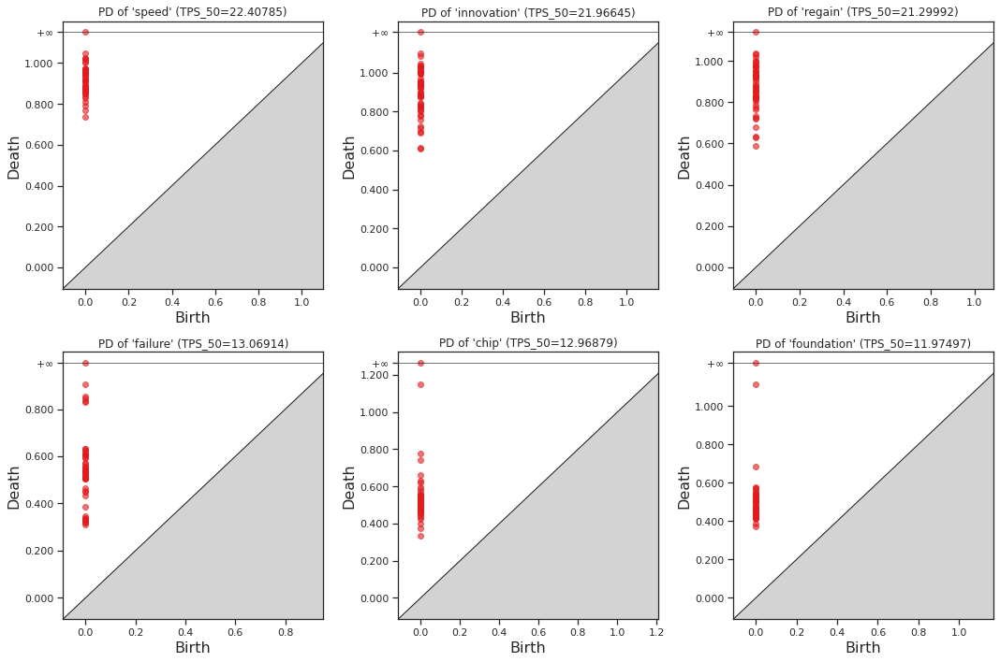

<IPython.core.display.Javascript object>

In [15]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(5 * 3, 5 * 2))
for (i, word, word_tps, _), ax in zip(top_bottom_k_semeval_tps_words, axes.ravel()):
    gd.plot_persistence_diagram(semeval_tps_persistence_diagrams_sorted[i], axes=ax)
    ax.set_title(f"PD of '{word}' (TPS_{tps_neighbourhood_size}={word_tps:.5f})")
plt.tight_layout()
plt.show()

## Neighbouring words of high/low TPS words

In [16]:
top_bottom_k_semeval_tps_vocab_word_ints = []
top_bottom_k_semeval_tps_word_neighbourhood = {}
for _, word, _, _ in top_bottom_k_semeval_tps_words:
    word_int = word_to_int[word]
    neighbouring_word_ints = last_embedding_weights_scann_instance.search(
        query_vector=last_embedding_weights_normalized[word_int],
        k_neighbours=tps_neighbourhood_size,
        excluded_neighbour_indices=[word_int],
    )
    top_bottom_k_semeval_tps_word_neighbourhood[word_int] = neighbouring_word_ints
    top_bottom_k_semeval_tps_vocab_word_ints.extend([word_int, *neighbouring_word_ints])

<IPython.core.display.Javascript object>

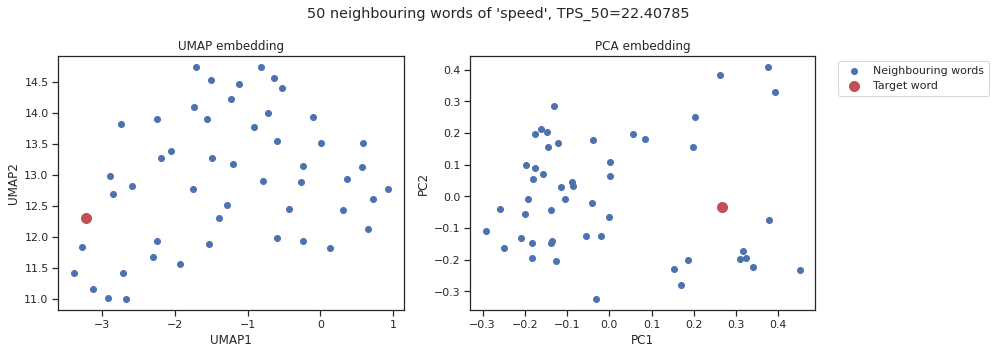

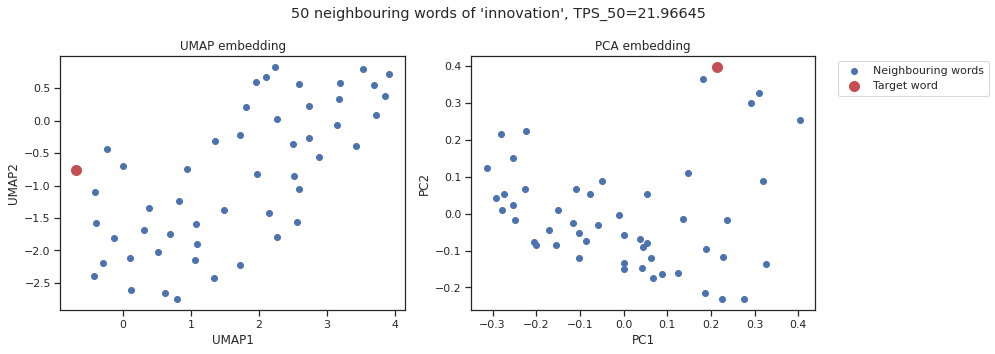

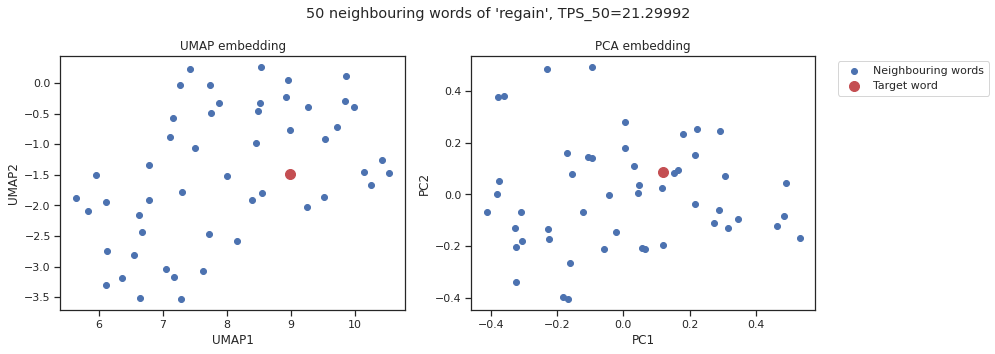

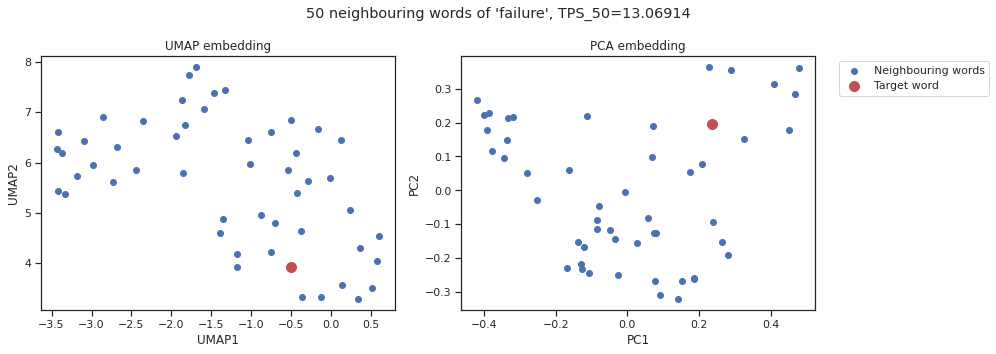

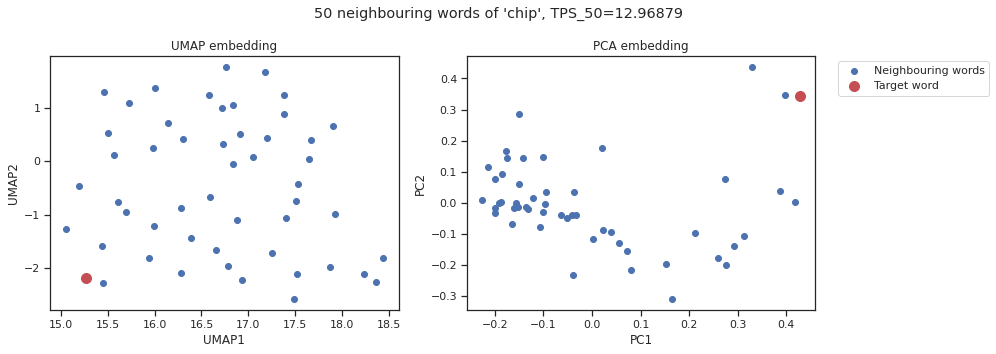

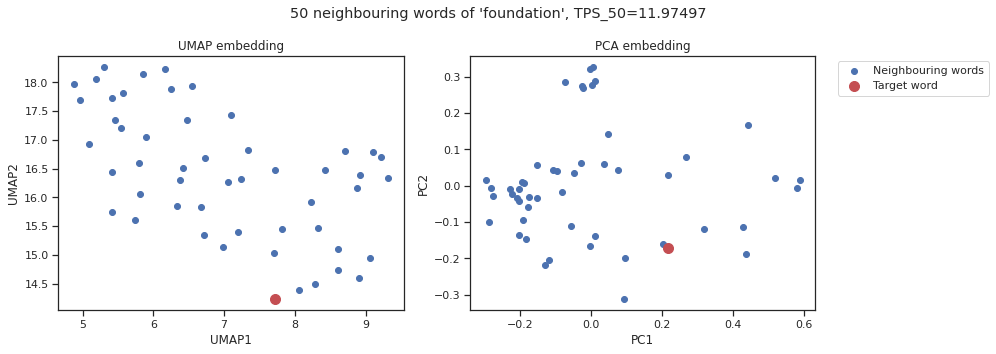

<IPython.core.display.Javascript object>

In [17]:
for _, word, word_tps, _ in top_bottom_k_semeval_tps_words:

    # Find neighbouring word ints
    word_int = word_to_int[word]
    neighbouring_word_ints = last_embedding_weights_scann_instance.search(
        query_vector=last_embedding_weights_normalized[word_int],
        k_neighbours=tps_neighbourhood_size,
        excluded_neighbour_indices=[word_int],
    )

    # Compute UMAP and PCA embedding of neighbouring words
    embedders = [(UMAP, "UMAP1", "UMAP2"), (PCA, "PC1", "PC2")]
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(7 * 2, 5))
    for (embedder, x_label, y_label), ax in zip(embedders, axes.ravel()):
        tps_word_embeddings_transformed = embedder(
            n_components=2,
            random_state=rng_seed,
        ).fit_transform(
            last_embedding_weights_normalized[[word_int, *neighbouring_word_ints]]
        )

        ax.scatter(
            tps_word_embeddings_transformed[1:, 0],
            tps_word_embeddings_transformed[1:, 1],
            c="b",
            label="Neighbouring words",
        )
        ax.scatter(
            tps_word_embeddings_transformed[0, 0],
            tps_word_embeddings_transformed[0, 1],
            c="r",
            s=100,
            label="Target word",
        )
        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)
        ax.set_title(f"{embedder.__name__} embedding")
    plt.suptitle(
        f"{tps_neighbourhood_size} neighbouring words of '{word}', TPS_{tps_neighbourhood_size}={word_tps:.5f}"
    )
    plt.legend(bbox_to_anchor=(1.05, 1.0), loc="upper left")
    plt.tight_layout()
    plt.show()

## TPS of points in n-dimensional spheres

-- Sphere dimensionality: 2 --


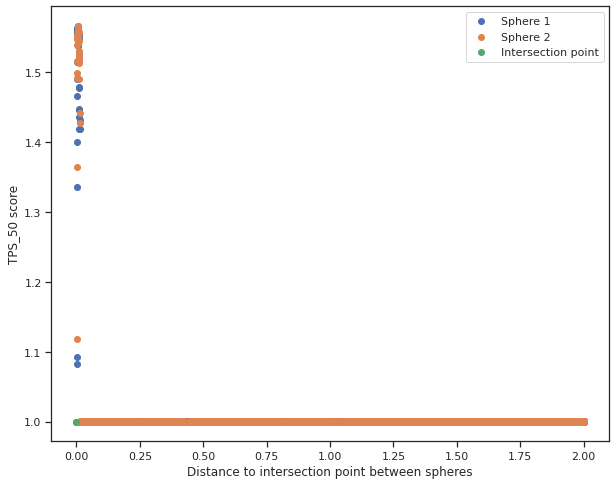

Sphere 1 mean: 1.0017728043810838
Sphere 2 mean: 1.0019910959562282
Intersection TPS: 1.0000718987627262
-- Sphere dimensionality: 3 --


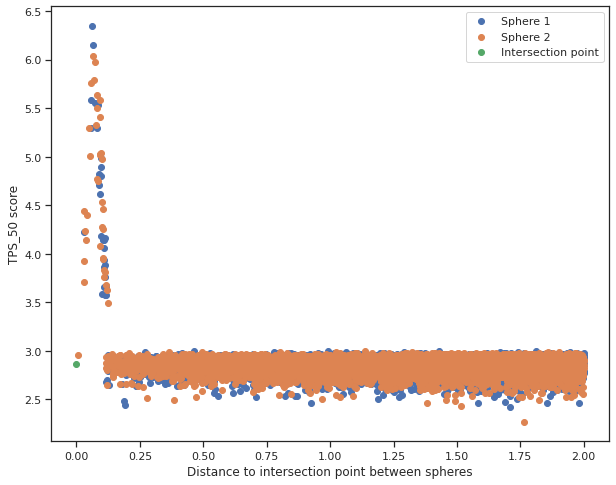

Sphere 1 mean: 2.8589610127508442
Sphere 2 mean: 2.8617158564967204
Intersection TPS: 2.8678184029557237
-- Sphere dimensionality: 4 --


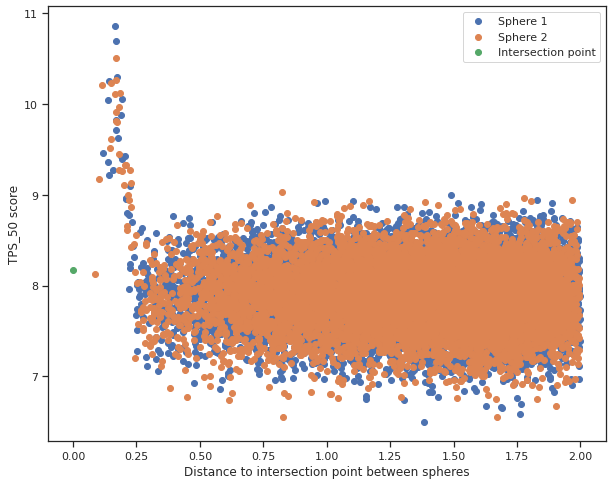

Sphere 1 mean: 7.899745620550166
Sphere 2 mean: 7.89507329535322
Intersection TPS: 8.171562370454016
-- Sphere dimensionality: 5 --


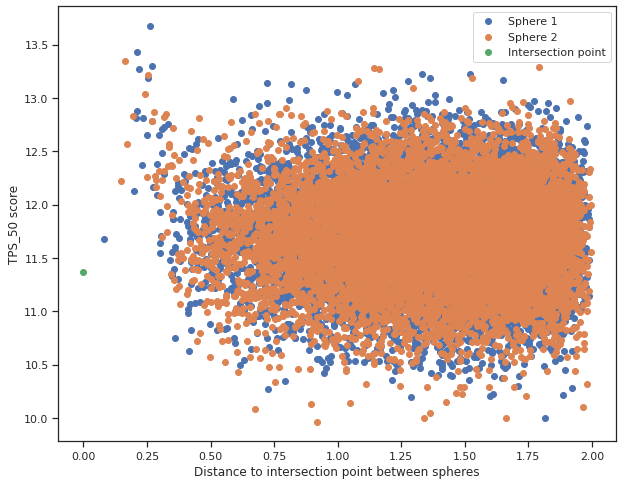

Sphere 1 mean: 11.70348509761624
Sphere 2 mean: 11.693608507831074
Intersection TPS: 11.371751431172228
-- Sphere dimensionality: 10 --


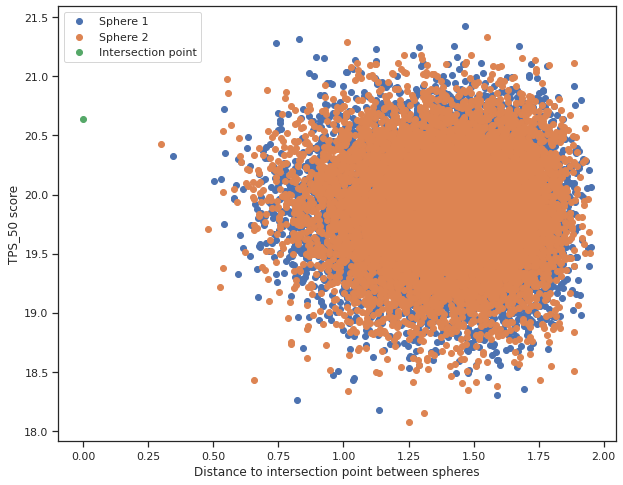

Sphere 1 mean: 19.865333475550305
Sphere 2 mean: 19.874346332646954
Intersection TPS: 20.64175424597512
-- Sphere dimensionality: 20 --


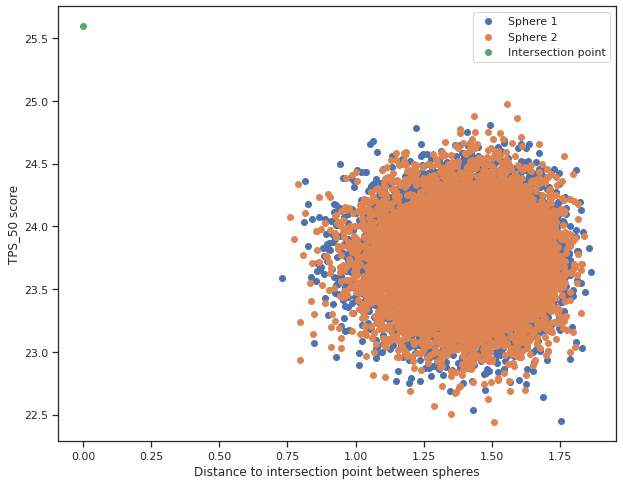

Sphere 1 mean: 23.74825896759272
Sphere 2 mean: 23.739527686079175
Intersection TPS: 25.594971997066352
-- Sphere dimensionality: 50 --


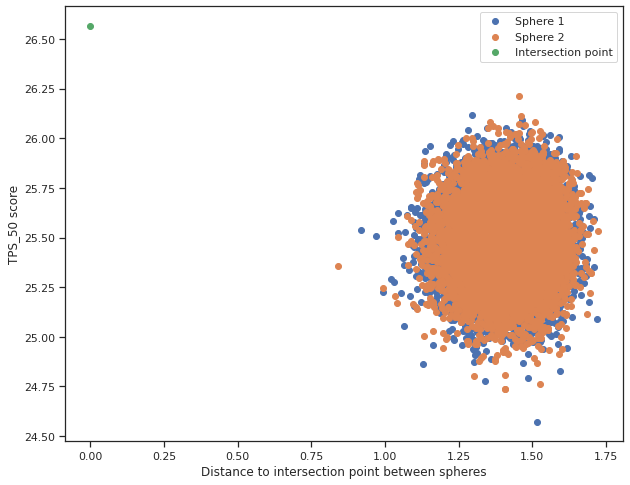

Sphere 1 mean: 25.484432753517314
Sphere 2 mean: 25.48744258677551
Intersection TPS: 26.564788307214428
-- Sphere dimensionality: 300 --


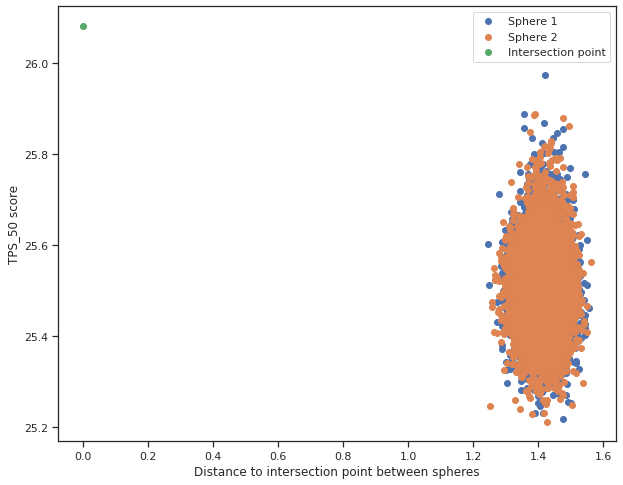

Sphere 1 mean: 25.4967416171684
Sphere 2 mean: 25.49875245899524
Intersection TPS: 26.081379558301098


<IPython.core.display.Javascript object>

In [4]:
visualize_spheres = True
sphere_dimensionalities = [2, 3, 4, 5, 10, 20, 50, 300]
tps_spheres_experiment_dir = join(
    topological_data_analysis_data_dir, "tps_spheres_experiment"
)
for sphere_dimensionality in sphere_dimensionalities:
    print(f"-- Sphere dimensionality: {sphere_dimensionality} --")
    sampled_sphere_points_data_filepath = join(
        tps_spheres_experiment_dir,
        f"sampled_sphere_points_data_{sphere_dimensionality}.npy",
    )
    sampled_sphere_points_tps_scores_filepath = join(
        tps_spheres_experiment_dir,
        f"sphere_points_data_{sphere_dimensionality}_tps_{tps_neighbourhood_size}_scores.npy",
    )
    sampled_sphere_points_data = np.load(sampled_sphere_points_data_filepath)
    sphere_points = sampled_sphere_points_data[:, :-3]
    sphere_point_labels = sampled_sphere_points_data[:, -3]
    distances_to_intersection_point = sampled_sphere_points_data[:, -2]
    tps_scores_point_in_spheres = np.load(sampled_sphere_points_tps_scores_filepath)

    # Visualize
    if visualize_spheres and sphere_dimensionality <= 3:
        fig = go.Figure()
        if sphere_dimensionality == 3:
            fig.add_trace(
                go.Scatter3d(
                    x=sphere_points[:, 0],
                    y=sphere_points[:, 1],
                    z=sphere_points[:, 2],
                    mode="markers",
                    marker={
                        "color": sphere_point_labels,
                    },
                )
            )
        else:
            fig.add_trace(
                go.Scatter(
                    x=sphere_points[:, 0],
                    y=sphere_points[:, 1],
                    mode="markers",
                    marker={
                        "color": sphere_point_labels,
                    },
                )
            )
        fig.show()

    # Find indices of points
    point_indices_in_sphere_1 = np.where(sphere_point_labels == 0)[0]
    point_indices_in_sphere_2 = np.where(sphere_point_labels == 1)[0]
    point_index_intersect = np.where(sphere_point_labels == 2)[0][0]

    # Plot distance to intersection point vs. TPS score
    fig, ax = plt.subplots(figsize=(10, 8))
    for i in range(3):
        point_indices = np.where(sphere_point_labels == i)[0]
        ax.scatter(
            x=distances_to_intersection_point[point_indices],
            y=tps_scores_point_in_spheres[point_indices],
        )
    ax.set_xlabel("Distance to intersection point between spheres")
    ax.set_ylabel("TPS_50 score")
    plt.legend(["Sphere 1", "Sphere 2", "Intersection point"])
    plt.show()

    if visualize_spheres and sphere_dimensionality <= 3:
        fig = go.Figure()
        if sphere_dimensionality == 3:
            fig.add_trace(
                go.Scatter3d(
                    x=sphere_points[:, 0],
                    y=sphere_points[:, 1],
                    z=sphere_points[:, 2],
                    mode="markers",
                    marker={
                        "color": tps_scores_point_in_spheres,
                    },
                    hovertext=tps_scores_point_in_spheres,
                )
            )
        else:
            fig.add_trace(
                go.Scatter(
                    x=sphere_points[:, 0],
                    y=sphere_points[:, 1],
                    mode="markers",
                    marker={
                        "color": tps_scores_point_in_spheres,
                    },
                    hovertext=tps_scores_point_in_spheres,
                )
            )
        fig.show()

    # sns.histplot(tps_scores_point_in_spheres[point_indices_in_sphere_1])
    plt.show()
    print(
        "Sphere 1 mean:",
        np.mean(tps_scores_point_in_spheres[point_indices_in_sphere_1]),
    )

    # sns.histplot(tps_scores_point_in_spheres[point_indices_in_sphere_2])
    plt.show()
    print(
        "Sphere 2 mean:",
        np.mean(tps_scores_point_in_spheres[point_indices_in_sphere_2]),
    )

    print("Intersection TPS:", tps_scores_point_in_spheres[point_index_intersect])